In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
%matplotlib inline
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [2]:
smarket = pd.read_csv('data/Smarket.csv', index_col=0, parse_dates=True)
smarket.head()

,Year,Lag1,Lag2,Lag3,Lag4,Lag5,Volume,Today,Direction
1,2001,0.381,-0.192,-2.624,-1.055,5.010,1.1913,0.959,Up
2,2001,0.959,0.381,-0.192,-2.624,-1.055,1.2965,1.032,Up
3,2001,1.032,0.959,0.381,-0.192,-2.624,1.4112,-0.623,Down
4,2001,-0.623,1.032,0.959,0.381,-0.192,1.2760,0.614,Up
5,2001,0.614,-0.623,1.032,0.959,0.381,1.2057,0.213,Up


In [3]:
smarket.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1250 entries, 1 to 1250
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Year       1250 non-null   int64  
 1   Lag1       1250 non-null   float64
 2   Lag2       1250 non-null   float64
 3   Lag3       1250 non-null   float64
 4   Lag4       1250 non-null   float64
 5   Lag5       1250 non-null   float64
 6   Volume     1250 non-null   float64
 7   Today      1250 non-null   float64
 8   Direction  1250 non-null   object 
dtypes: float64(7), int64(1), object(1)
memory usage: 97.7+ KB


In [4]:
smarket.corr()

,Year,Lag1,Lag2,Lag3,Lag4,Lag5,Volume,Today
Year,1.000000,0.029700,0.030596,0.033195,0.035689,0.029788,0.539006,0.030095
Lag1,0.029700,1.000000,-0.026294,-0.010803,-0.002986,-0.005675,0.040910,-0.026155
Lag2,0.030596,-0.026294,1.000000,-0.025897,-0.010854,-0.003558,-0.043383,-0.010250
Lag3,0.033195,-0.010803,-0.025897,1.000000,-0.024051,-0.018808,-0.041824,-0.002448
Lag4,0.035689,-0.002986,-0.010854,-0.024051,1.000000,-0.027084,-0.048414,-0.006900
Lag5,0.029788,-0.005675,-0.003558,-0.018808,-0.027084,1.000000,-0.022002,-0.034860
Volume,0.539006,0.040910,-0.043383,-0.041824,-0.048414,-0.022002,1.000000,0.014592
Today,0.030095,-0.026155,-0.010250,-0.002448,-0.006900,-0.034860,0.014592,1.000000


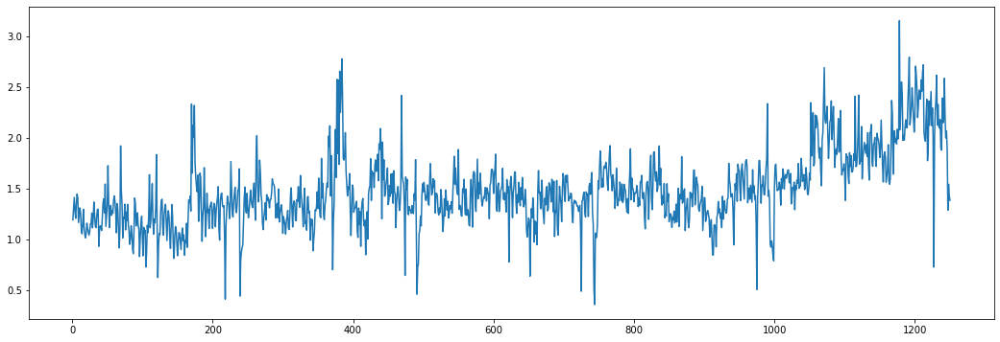

In [5]:
plt.figure(figsize=(18,6))
plt.plot(smarket['Volume'])
plt.show()

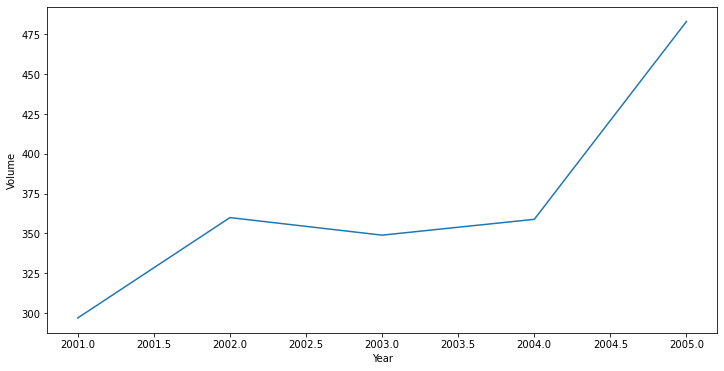

In [6]:
smarket_yearly = smarket.groupby('Year').sum()
plt.figure(figsize=(12,6))
sb.lineplot(data=smarket_yearly, x=smarket_yearly.index, y='Volume');

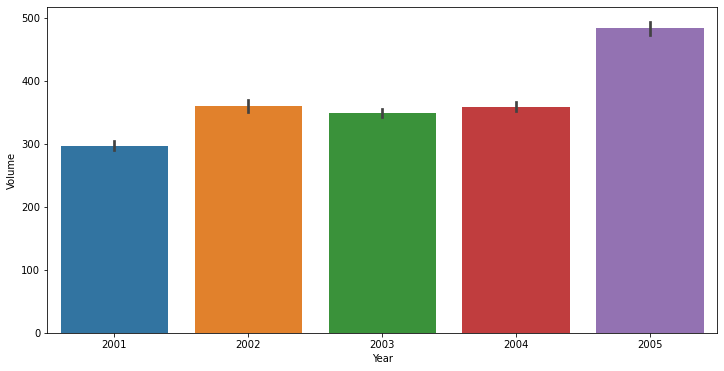

In [7]:
plt.figure(figsize=(12,6))
sb.barplot(data=smarket, x='Year', y='Volume', estimator=np.sum);

In [8]:
logis_regr = smf.glm(formula='Direction ~ Lag1 + Lag2 + Lag3 + Lag4 + Lag5 + Volume', data=smarket, family=sm.families.Binomial()).fit()
print(logis_regr.summary())

                          Generalized Linear Model Regression Results                           
Dep. Variable:     ['Direction[Down]', 'Direction[Up]']   No. Observations:                 1250
Model:                                              GLM   Df Residuals:                     1243
Model Family:                                  Binomial   Df Model:                            6
Link Function:                                    logit   Scale:                          1.0000
Method:                                            IRLS   Log-Likelihood:                -863.79
Date:                                  Sun, 11 Oct 2020   Deviance:                       1727.6
Time:                                          01:26:05   Pearson chi2:                 1.25e+03
No. Iterations:                                       4                                         
Covariance Type:                              nonrobust                                         
                 coef    std e

In [10]:
logis_regr.params

Intercept    0.126000
Lag1         0.073074
Lag2         0.042301
Lag3        -0.011085
Lag4        -0.009359
Lag5        -0.010313
Volume      -0.135441
dtype: float64

In [11]:
logis_regr.pvalues

Intercept    0.600700
Lag1         0.145232
Lag2         0.398352
Lag3         0.824334
Lag4         0.851445
Lag5         0.834998
Volume       0.392404
dtype: float64

In [12]:
print(logis_regr.model.endog_names)

['Direction[Down]', 'Direction[Up]']


In [13]:
predictions = logis_regr.predict()
predictions[:10]

array([0.49291587, 0.51853212, 0.51886117, 0.48477764, 0.48921884,
       0.49304354, 0.50734913, 0.49077084, 0.48238647, 0.51116222])

In [14]:
predictions_nominal = ['Down' if x > 0.5 else 'Up' for x in predictions]
result = pd.DataFrame({'Direction': smarket['Direction'], 'Prediction':predictions_nominal})
result['Bool'] = result['Direction'] == result['Prediction']
result

,Direction,Prediction,Bool
1,Up,Up,True
2,Up,Down,False
3,Down,Down,True
4,Up,Up,True
5,Up,Up,True
...,...,...,...
1246,Up,Up,True
1247,Down,Up,False
1248,Up,Up,True
1249,Down,Up,False


In [15]:
print('Precentage right prediction %.2f' %(result['Bool'].sum()/result.shape[0]*100)+' %')

Precentage right prediction 52.16 %


In [16]:
from sklearn.metrics import confusion_matrix, classification_report
print(confusion_matrix(smarket['Direction'], predictions_nominal))

[[145 457]
 [141 507]]


In [17]:
np.mean(smarket['Direction']==predictions_nominal)

0.5216

In [18]:
smarket_train = smarket[smarket['Year']<2005]
smarket_test  = smarket[smarket['Year']>=2005]

In [19]:
logis_regr_2 = smf.glm(formula='Direction ~ Lag1 + Lag2 + Lag3 + Lag4 + Lag5 + Volume', data=smarket_train, family=sm.families.Binomial()).fit()
print(logis_regr_2.summary())

                          Generalized Linear Model Regression Results                           
Dep. Variable:     ['Direction[Down]', 'Direction[Up]']   No. Observations:                  998
Model:                                              GLM   Df Residuals:                      991
Model Family:                                  Binomial   Df Model:                            6
Link Function:                                    logit   Scale:                          1.0000
Method:                                            IRLS   Log-Likelihood:                -690.55
Date:                                  Thu, 08 Oct 2020   Deviance:                       1381.1
Time:                                          14:43:17   Pearson chi2:                     998.
No. Iterations:                                       4                                         
Covariance Type:                              nonrobust                                         
                 coef    std e

In [20]:
predictions_test = logis_regr_2.predict(smarket_test)
predictions_nominal_test = ['Down' if x > 0.5 else 'Up' for x in predictions_test]
print(classification_report(smarket_test['Direction'], predictions_nominal_test))

              precision    recall  f1-score   support

        Down       0.44      0.69      0.54       111
          Up       0.56      0.31      0.40       141

    accuracy                           0.48       252
   macro avg       0.50      0.50      0.47       252
weighted avg       0.51      0.48      0.46       252



In [21]:
print('Accuracy rate: %.2f' %np.mean(smarket_test['Direction']==predictions_nominal_test))
print('Error rate: %.2f' %(1-np.mean(smarket_test['Direction']==predictions_nominal_test)))

Accuracy rate: 0.48
Error rate: 0.52


In [22]:
logis_regr_3 = smf.glm(formula='Direction ~ Lag1 + Lag2', data=smarket_train, family=sm.families.Binomial()).fit()
print(logis_regr_3.summary())

                          Generalized Linear Model Regression Results                           
Dep. Variable:     ['Direction[Down]', 'Direction[Up]']   No. Observations:                  998
Model:                                              GLM   Df Residuals:                      995
Model Family:                                  Binomial   Df Model:                            2
Link Function:                                    logit   Scale:                          1.0000
Method:                                            IRLS   Log-Likelihood:                -690.70
Date:                                  Thu, 08 Oct 2020   Deviance:                       1381.4
Time:                                          14:43:17   Pearson chi2:                     998.
No. Iterations:                                       4                                         
Covariance Type:                              nonrobust                                         
                 coef    std e

In [23]:
predictions_test_3 = logis_regr_3.predict(smarket_test)
predictions_nominal_test_3 = ['Down' if x > 0.5 else 'Up' for x in predictions_test_3]
print(classification_report(smarket_test['Direction'], predictions_nominal_test_3))

              precision    recall  f1-score   support

        Down       0.50      0.32      0.39       111
          Up       0.58      0.75      0.66       141

    accuracy                           0.56       252
   macro avg       0.54      0.53      0.52       252
weighted avg       0.55      0.56      0.54       252



In [24]:
print('Accuracy rate: %.2f' %np.mean(smarket_test['Direction']==predictions_nominal_test_3))
print('Error rate: %.2f' %(1-np.mean(smarket_test['Direction']==predictions_nominal_test_3)))

Accuracy rate: 0.56
Error rate: 0.44


In [25]:
print(pd.DataFrame(confusion_matrix(predictions_nominal_test_3, smarket_test['Direction']), 
                            ['Pred Down', 'Pred Up'], ['Down', 'Up']))

           Down   Up
Pred Down    35   35
Pred Up      76  106


In [26]:
logis_regr_3.predict(pd.DataFrame([[1.2,1.1],
                                   [1.5,-0.8]], columns=['Lag1','Lag2']))

0    0.520854
1    0.503906
dtype: float64

<Figure size 864x864 with 0 Axes>

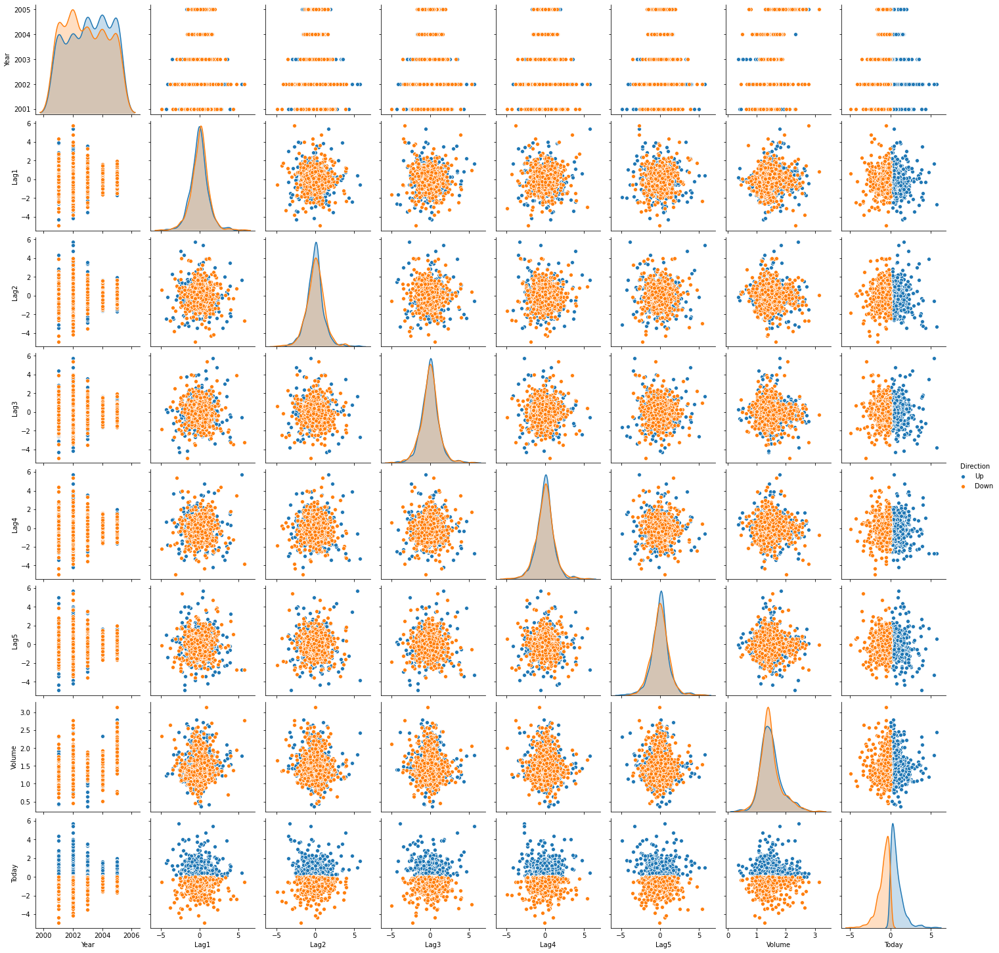

In [27]:
plt.figure(figsize=(12,12))
sb.pairplot(data=smarket, hue='Direction');